## Import & implementation of some regularly used functions

In [5]:
import json

import matplotlib.pyplot as plt
import numpy as np
import scipy
import skimage
from scipy import ndimage

from core.analyzer import Analyzer
from core.diffusion_array import DiffusionArray

alias_to_file = dict()
with open('../config.json', 'r') as json_file:
    config_file = json.load(json_file)

for details in config_file.values():
    alias = details['alias']
    path = details['path']
    alias_to_file[alias] = path

darr_w_bcg = DiffusionArray(alias_to_file['ATP-kozep-017']).channel(0)

In [6]:
def plot_morphed(image, morphed, filled):
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6.5), dpi=100)

    ax[0].imshow(image)
    ax[0].set_title('Original image')
    ax[0].contour(filled, colors='red')
    ax[0].axis('off')

    ax[1].imshow(morphed)
    ax[1].set_title('Morphed')
    ax[1].axis('off')

    ax[2].imshow(filled)
    ax[2].set_title('Filled')
    ax[2].axis('off')

    fig.tight_layout()
    plt.show()


def plot_clustering(image, clustered, markers=None):
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6.5), dpi=100)
    np.random.seed(420)

    unique_labels = np.unique(clustered)[1:]
    shuffled_labels = unique_labels.copy()
    np.random.shuffle(shuffled_labels)
    label_mapping = {old_label: new_label for old_label, new_label in zip(unique_labels, shuffled_labels)}
    label_mapping[0] = 0

    clustered = np.vectorize(label_mapping.get)(clustered)

    ax[0].imshow(image)
    ax[0].set_title('Original image')
    ax[0].axis('off')

    cmap = plt.get_cmap('tab20b')
    cmap.set_bad('black', 1.)  # 'bad' data points (such as NaNs or infs) are shown as black
    clustered_masked = np.ma.masked_where(clustered == 0, clustered)  # Mask '0' values
    ax[1].imshow(clustered_masked, cmap=cmap, interpolation='none')
    ax[1].set_title('Clustering')
    ax[1].axis('off')

    ax[2].imshow(image)
    ax[2].imshow(clustered, alpha=0.3, cmap='tab20b', interpolation='none')
    ax[2].set_title('Overlapped')
    ax[2].axis('off')

    if markers is not None:
        ax[1].scatter(markers[:, 1], markers[:, 0], color='red', s=5)
        ax[2].scatter(markers[:, 1], markers[:, 0], color='red', s=5)

    fig.tight_layout()
    plt.show()


def plot_local_mins(image, edges, loc_mins):
    fig, ax = plt.subplots(nrows=1, ncols=2, dpi=100, figsize=(24, 12))
    ax[0].imshow(edges)
    ax[0].set_title('Edges')
    ax[0].axis('off')

    ax[1].imshow(image)
    ax[1].set_title('Image')
    lm = np.array([rp.centroid for rp in skimage.measure.regionprops(skimage.morphology.label(loc_mins))])
    x = np.array([point[1] for point in lm])
    y = np.array([point[0] for point in lm])
    ax[1].scatter(x, y, color='red')
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()


def create_local_min_labels(image, mask, min_distance=15):
    loc_mins = skimage.feature.peak_local_max(-image, min_distance=min_distance, labels=mask.astype(np.int32))

    loc_min_mask = np.zeros(shape=image.shape, dtype=np.bool_)
    x_coords, y_coords = zip(*loc_mins)
    loc_min_mask[x_coords, y_coords] = 1

    return skimage.morphology.label(loc_min_mask)


def interpolate(shape, points):
    x = np.array([point[1] for point in points])
    y = np.array([point[0] for point in points])
    values = np.array([point[2] for point in points])

    x_grid, y_grid = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))

    spline_interpolator = scipy.interpolate.CloughTocher2DInterpolator((x, y), values)
    interpolated_values = spline_interpolator(x_grid, y_grid)
    # interpolated_values = scipy.interpolate.griddata((x, y), values, (x_grid, y_grid), method='cubic')
    return interpolated_values

    # num_neighbors = 7

    # grid_coordinates = np.column_stack((x_grid.ravel(), y_grid.ravel()))
    # distances = scipy.spatial.distance.cdist(grid_coordinates, np.column_stack((x, y)))
    # indices = np.argpartition(distances, num_neighbors, axis=1)[:, :num_neighbors]
    # weights = 1 / np.where(distances[np.arange(distances.shape[0])[:, None], indices] == 0, 1e6, distances[np.arange(distances.shape[0])[:, None], indices])
    # interpolated_values = np.sum(values[indices] * weights, axis=1) / np.sum(weights, axis=1)

    # return interpolated_values.reshape(shape)


def color_segmented_by_percentile(segmented, region_props, not_segmented_image, q=50):
    colored = np.zeros(segmented.shape)

    for region_prop in region_props:
        mask = segmented == region_prop.label
        percentile = np.percentile(not_segmented_image[mask], q=q)

        colored[mask] = percentile

    return colored


def get_centroids_with_values(segmented, region_props, not_segmented_image, q=50, include_corners=True):
    points = []

    for region_prop in region_props:
        mask = segmented == region_prop.label
        percentile = np.percentile(not_segmented_image[mask], q=q)
        points.append((*region_prop.centroid, percentile))

    if include_corners:
        width = segmented.shape[1]
        height = segmented.shape[0]
        for (y, x) in (
                *[(i, j) for j in range(0, width, width // 6) for i in (0, height)],
                *[(i, j) for i in range(0, height, height // 6) for j in (0, width)],
                (width, height)
        ):
            percentile = np.percentile(
                not_segmented_image[max(0, y - 5):min(height, y + 5), max(0, x - 5):min(width, x + 5)],
                q=50
            )
            points.append((y, x, percentile))

    return points


def homogenize(image, center):
    center_x, center_y = center
    xs, ys = np.meshgrid(np.arange(image.shape[1]), np.arange(image.shape[0]))
    xs -= round(center_x)
    ys -= round(center_y)

    distances = np.hypot(xs, ys)
    homogenized = distances[:]
    max_distance = int(np.ceil(np.max(distances)))

    for i in range(max_distance):
        distances_i_delta_r_ = (i <= distances) & (distances < i + 1)
        homogenized[distances_i_delta_r_] = np.median(image[distances_i_delta_r_])

    return homogenized


def plot_interpolated(colored_image, interpolated_image, homogenized_image, centroids):
    x = np.array([point[1] for point in centroids])
    y = np.array([point[0] for point in centroids])

    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6.5), dpi=100)
    ax[0].imshow(colored_image)
    ax[0].set_title('Colored by intensity')
    ax[0].scatter(x, y, color='red', s=5)
    ax[0].set_xlim(0, colored_image.shape[1])
    ax[0].set_ylim(colored_image.shape[0], 0)
    ax[0].axis('off')

    ax[1].imshow(interpolated_image)
    ax[1].set_title('Interpolated')
    ax[1].axis('off')

    ax[2].imshow(homogenized_image)
    ax[2].set_title('Homogenized')
    ax[2].axis('off')

    fig.tight_layout()
    plt.show()

## Prepare the data

In [7]:
clipped_array = darr_w_bcg[:]
low_thresh = np.percentile(clipped_array, q=0.1)
high_thresh = np.percentile(clipped_array, q=99.9)

clipped_array[clipped_array < low_thresh] = low_thresh
clipped_array[clipped_array > high_thresh] = high_thresh

darr_w_bcg = darr_w_bcg.updated_ndarray(clipped_array).normalized().updated_ndarray()
start_frame = Analyzer(darr_w_bcg).detect_diffusion_start_frame()
start_place = Analyzer(darr_w_bcg).detect_diffusion_start_place()
darr = darr_w_bcg.background_removed(f'{start_frame - 1}:{start_frame}')

image = skimage.util.img_as_int(darr.frame(start_frame + 4))
smooth = skimage.filters.gaussian(image, sigma=1.5)

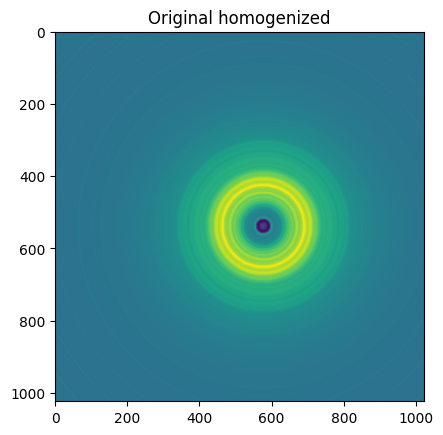

In [8]:
plt.imshow(homogenize(image, start_place))
plt.title('Original homogenized')
plt.show()

#### Where could cells be?

In [9]:
thresh = smooth > np.percentile(smooth, 83)
morphed = skimage.morphology.closing(
    skimage.morphology.opening(thresh),
    footprint=np.ones((3, 3))
)

labels = skimage.measure.label(morphed, connectivity=2)
largest_cc = labels == np.argmax(np.bincount(labels.flat)[1:]) + 1
filled = ndimage.binary_fill_holes(largest_cc)

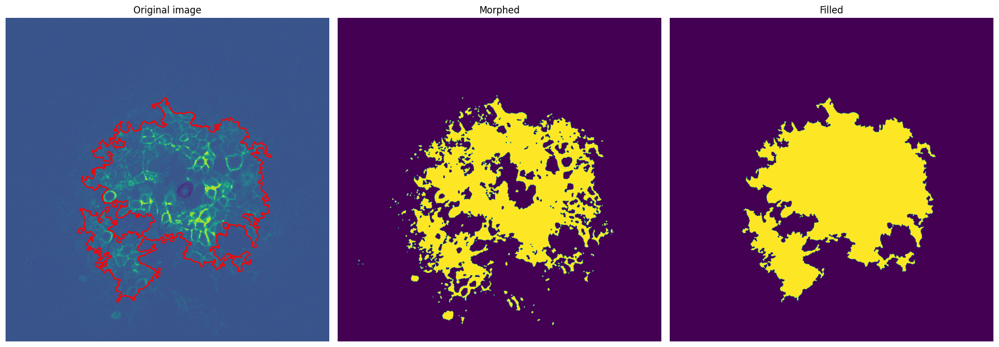

In [10]:
plot_morphed(image, morphed, filled)

## Segmentation

#### SLIC

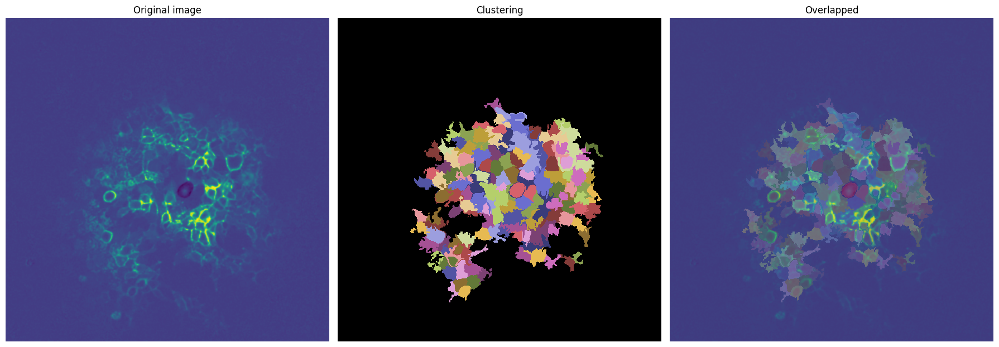

In [11]:
slic = skimage.segmentation.slic(
    smooth,
    n_segments=200,
    compactness=0.03,
    max_num_iter=100,
    mask=filled,
    start_label=1, channel_axis=None
)
plot_clustering(smooth, slic)

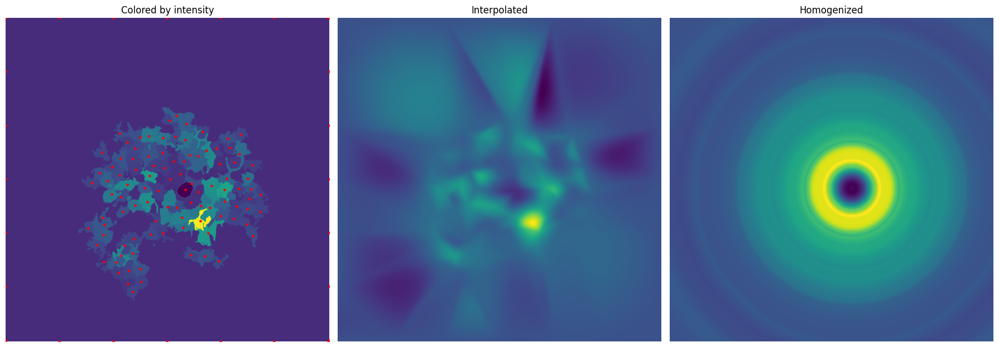

In [12]:
props_by_size = sorted(skimage.measure.regionprops(slic), key=lambda rp: rp.area, reverse=True)[:100]
slic_colored = color_segmented_by_percentile(slic, props_by_size, not_segmented_image=smooth)
slic_centroids = get_centroids_with_values(slic, props_by_size, not_segmented_image=smooth)

slic_interpolated = interpolate(image.shape, slic_centroids)
slic_homogenized = homogenize(slic_interpolated, start_place)

plot_interpolated(slic_colored, slic_interpolated, slic_homogenized, slic_centroids)

#### Watershed

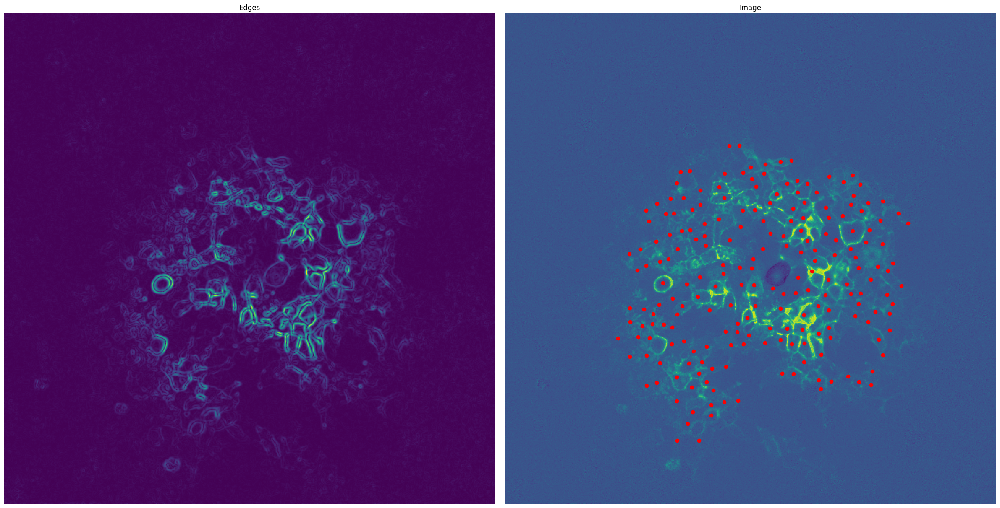

In [13]:
edges = np.abs(skimage.filters.sobel(smooth))
edge_morph = skimage.morphology.closing(skimage.morphology.opening(edges))
local_min_labels = create_local_min_labels(edge_morph, filled, min_distance=15)

plot_local_mins(image, edges, local_min_labels)

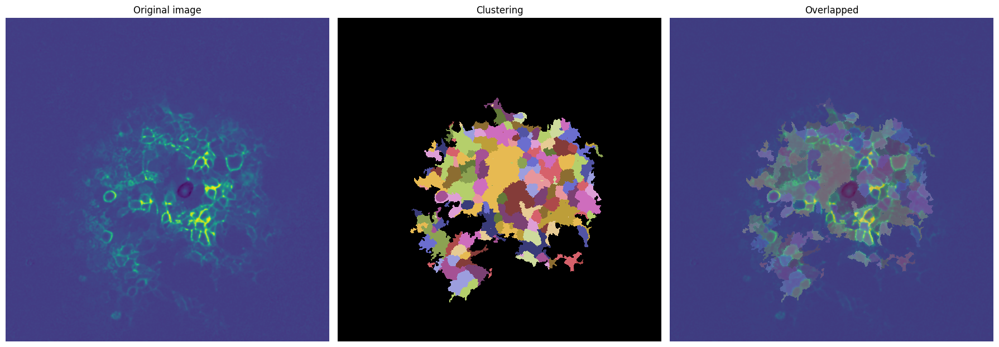

In [14]:
ws = skimage.segmentation.watershed(
    image, mask=filled,
    connectivity=1,
    compactness=0.1,
    markers=local_min_labels
)
plot_clustering(smooth, ws)

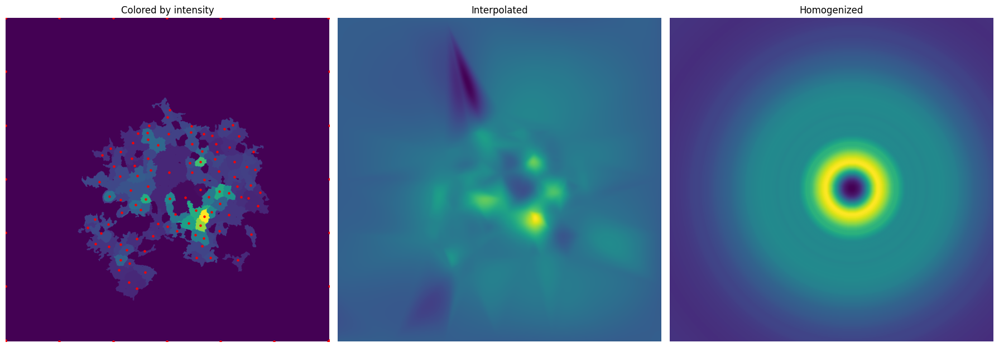

In [15]:
props_by_size = sorted(skimage.measure.regionprops(ws), key=lambda rp: rp.area, reverse=True)[:100]
ws_colored = color_segmented_by_percentile(ws, props_by_size, not_segmented_image=smooth)
ws_centroids = get_centroids_with_values(ws, props_by_size, not_segmented_image=smooth)

ws_interpolated = interpolate(image.shape, ws_centroids)
ws_homogenized = homogenize(ws_interpolated, start_place)

plot_interpolated(ws_colored, ws_interpolated, ws_homogenized, ws_centroids)

#### Watershed on differnce

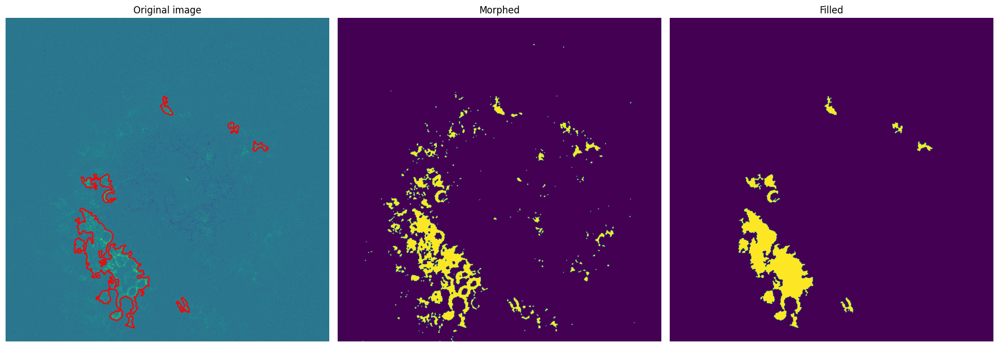

In [16]:
difference = skimage.util.img_as_int(
    darr_w_bcg.frame(start_frame + 5)[:] - darr_w_bcg.frame(start_frame + 4)[:]
)
difference_smooth = skimage.filters.gaussian(difference, sigma=1.5)

difference_thresh = difference_smooth > np.percentile(np.abs(difference_smooth), 95)
difference_morphed = skimage.morphology.closing(
    skimage.morphology.opening(difference_thresh),
    footprint=np.ones((3, 3))
)

labels = skimage.measure.label(difference_morphed, connectivity=2)
largest_labels = [
    label.label for label in
    sorted(skimage.measure.regionprops(labels), key=lambda region_prop: region_prop.area, reverse=True)[:50]
    if label.area > 40
]
comp_largest = np.zeros(difference_morphed.shape, dtype=np.bool_)
for label in largest_labels[:10]:
    comp_largest |= labels == label
difference_filled = ndimage.binary_fill_holes(comp_largest)

plot_morphed(difference, difference_morphed, difference_filled)

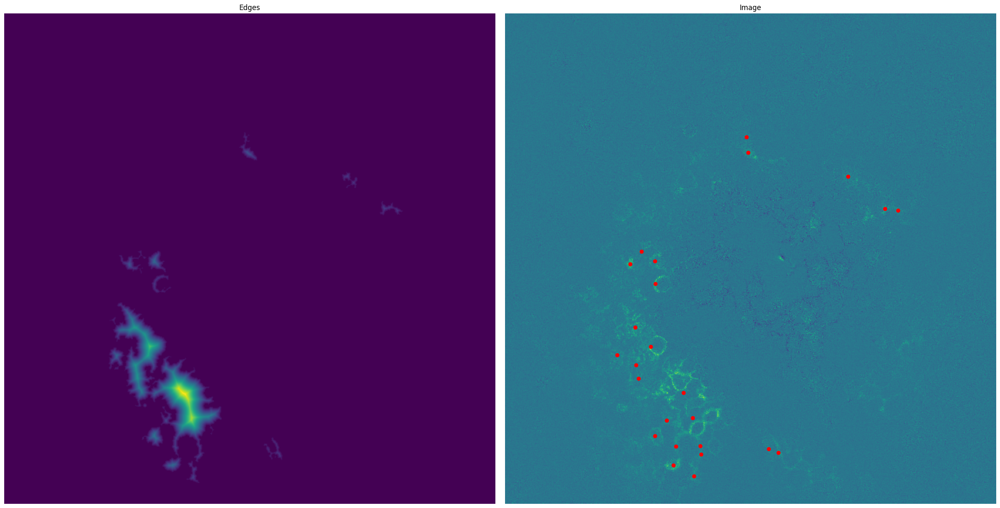

In [17]:
distances = ndimage.distance_transform_edt(difference_filled)

local_min_labels = create_local_min_labels(-distances, difference_filled)
plot_local_mins(difference, distances, local_min_labels)

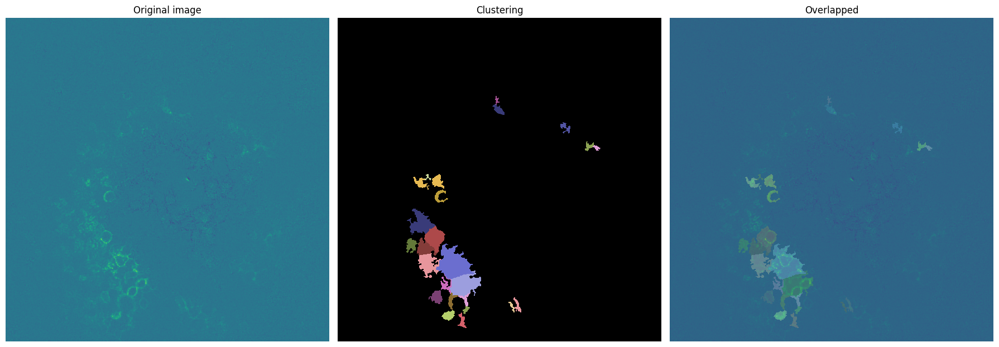

In [18]:
ws_edge = skimage.segmentation.watershed(
    -distances,
    mask=difference_filled,
    connectivity=1,
    compactness=0.1,
    markers=local_min_labels
)
plot_clustering(difference, ws_edge)

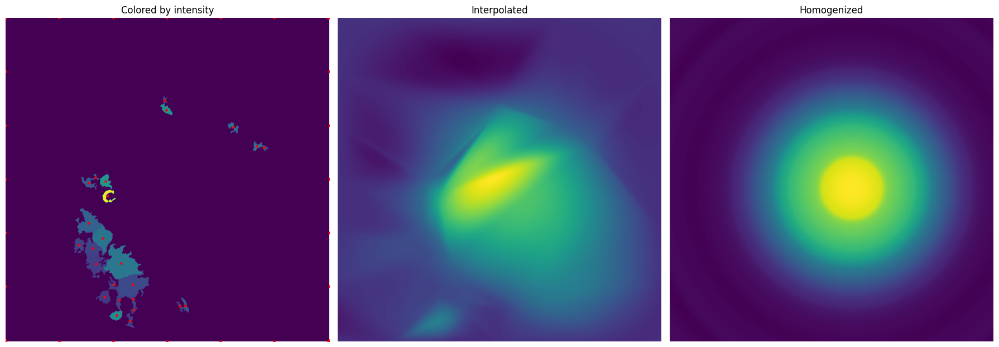

In [19]:
smooth = skimage.filters.gaussian(skimage.util.img_as_int(darr.frame(start_frame + 5)), sigma=1.5)
props_by_size = sorted(skimage.measure.regionprops(ws_edge), key=lambda rp: rp.area, reverse=True)[:100]
ws_edge_colored = color_segmented_by_percentile(ws_edge, props_by_size, not_segmented_image=smooth)
ws_edge_centroids = get_centroids_with_values(ws_edge, props_by_size, not_segmented_image=smooth)

ws_edge_interpolated = interpolate(image.shape, ws_edge_centroids)
ws_edge_homogenized = homogenize(ws_edge_interpolated, start_place)

plot_interpolated(ws_edge_colored, ws_edge_interpolated, ws_edge_homogenized, ws_edge_centroids)

#### Refined ws

In [20]:
edges = np.abs(skimage.filters.sobel(smooth))
edge_morph = skimage.morphology.closing(skimage.morphology.opening(edges))
local_min_labels = create_local_min_labels(edge_morph, filled, min_distance=12)


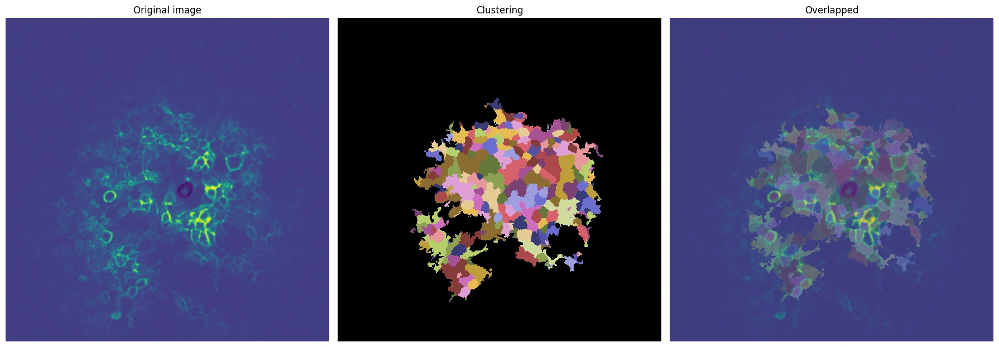

In [21]:
ws = skimage.segmentation.watershed(
    image, mask=filled,
    connectivity=1,
    compactness=0.1,
    markers=local_min_labels
)
plot_clustering(smooth, ws)

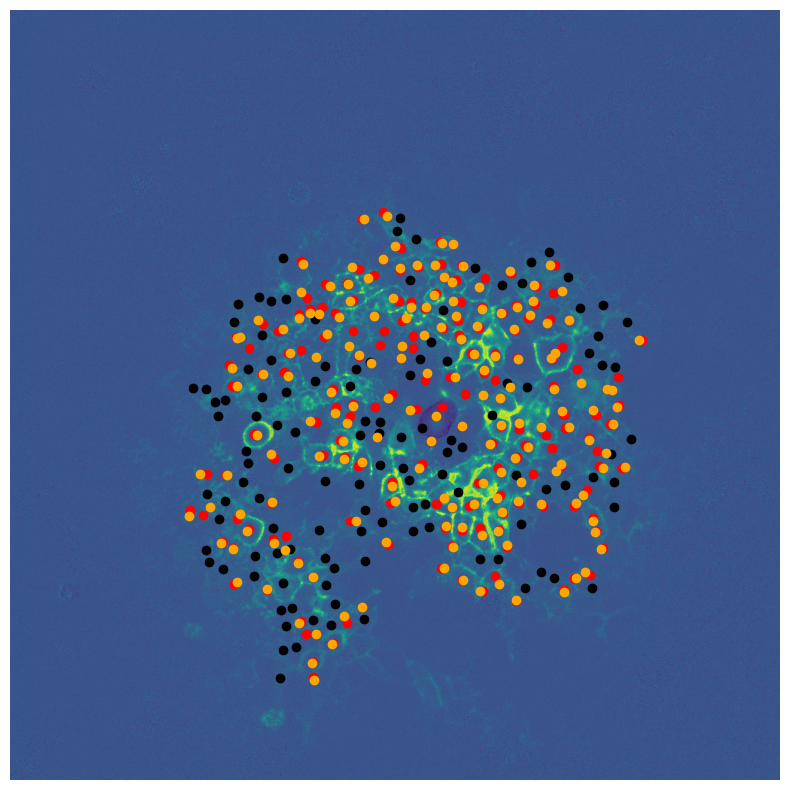

In [22]:
regions = skimage.measure.regionprops(ws)
min_area_threshold = np.percentile([region.area for region in regions], q=20)

filtered_regions = [region for region in regions if
                    region.solidity >= 0.7 and region.area >= min_area_threshold and image[
                        round(region.centroid[0]), round(region.centroid[1])] < np.percentile(image, q=95)]
after = np.zeros_like(ws)
for region in filtered_regions:
    after[ws == region.label] = region.label

fig, ax = plt.subplots(figsize=(8, 8), dpi=100)
ax.imshow(image)

lm = np.array(
    [rp.centroid for rp in skimage.measure.regionprops(skimage.morphology.label(local_min_labels * (after != 0)))])
x = np.array([point[1] for point in lm])
y = np.array([point[0] for point in lm])
ax.scatter(x, y, color='red')

lm = np.array(
    [rp.centroid for rp in skimage.measure.regionprops(skimage.morphology.label(local_min_labels * (after == 0)))])
x = np.array([point[1] for point in lm])
y = np.array([point[0] for point in lm])
ax.scatter(x, y, color='black')

marked = np.zeros_like(ws)
for region in filtered_regions:
    marked[round(region.centroid[0]), round(region.centroid[1])] = region.label
lm = np.array([rp.centroid for rp in skimage.measure.regionprops(skimage.morphology.label(marked))])
x = np.array([point[1] for point in lm])
y = np.array([point[0] for point in lm])
ax.scatter(x, y, color='orange')

ax.axis('off')
plt.tight_layout()
plt.show()

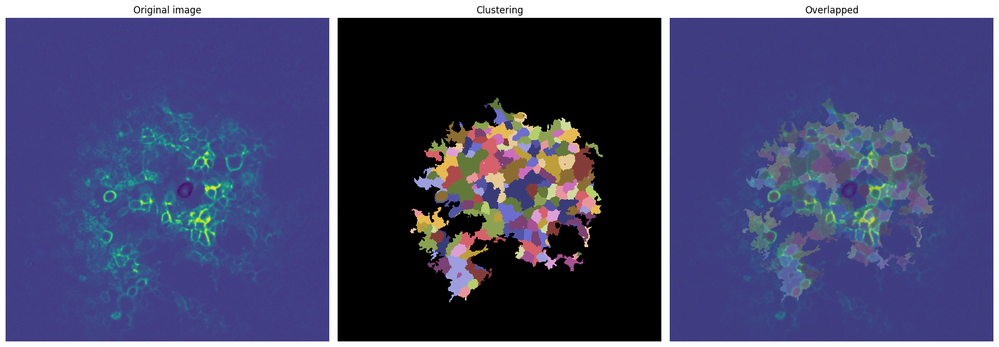

In [23]:
ws_a = skimage.segmentation.watershed(
    image, mask=filled,
    connectivity=1,
    compactness=10,
    markers=local_min_labels * (after != 0)
)

plot_clustering(smooth, ws_a)

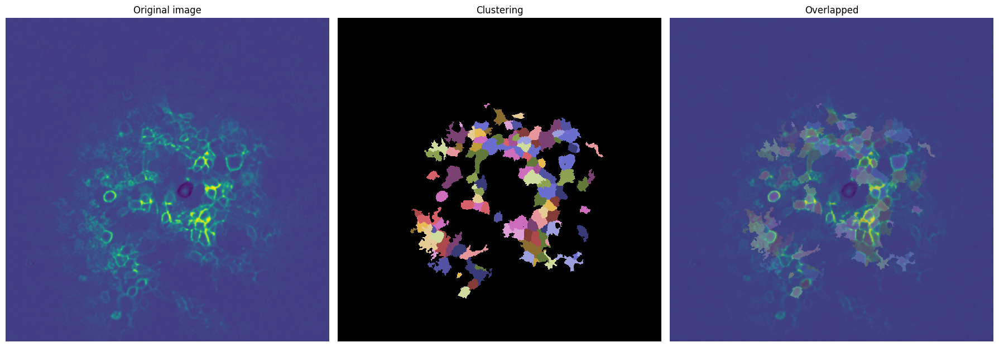

In [24]:
props = sorted(skimage.measure.regionprops(ws_a), key=lambda rp: rp.area, reverse=True)

avg_int = np.percentile([np.percentile(smooth[ws_a == pr.label], q=50) for pr in props], q=20)
area_min = np.percentile([prop.area for prop in props], q=10)
area_max = np.percentile([prop.area for prop in props], q=90)
props = [prop for prop in props if np.percentile(smooth[ws_a == prop.label],
                                                 q=50) > avg_int and prop.solidity >= 0.5 and area_min <= prop.area <= area_max]

rf_ws = np.zeros_like(ws)
for prop in props:
    rf_ws[ws_a == prop.label] = prop.label
plot_clustering(smooth, rf_ws)

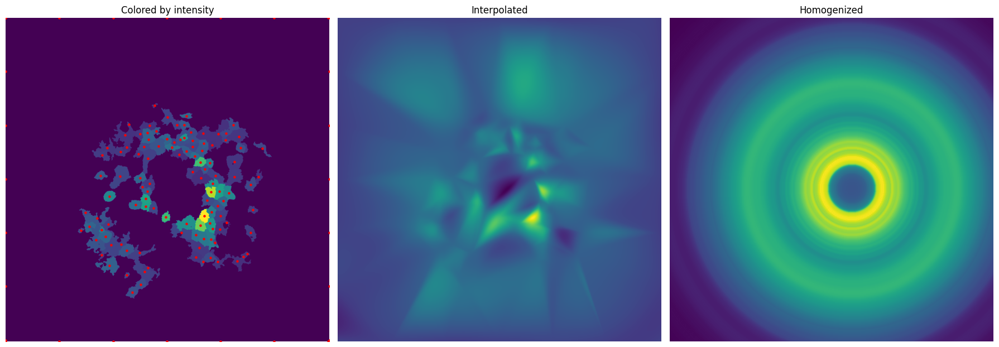

In [25]:
ws_colored = color_segmented_by_percentile(rf_ws, props, not_segmented_image=smooth)
ws_rf_centroids = get_centroids_with_values(rf_ws, props, not_segmented_image=smooth)

ws_interpolated = interpolate(image.shape, ws_rf_centroids)
ws_homogenized = homogenize(ws_interpolated, start_place)

plot_interpolated(ws_colored, ws_interpolated, ws_homogenized, ws_rf_centroids)

## Interpolations & comps

#### Select a segmentation

In [26]:
import ipywidgets as widgets
from IPython.display import display

segmentation_options = ['SLIC', 'Watershed', 'Watershed on Difference', 'Refined watershed']
dropdown = widgets.Dropdown(options=segmentation_options, value='SLIC', description='Segmentation Method:')
output = widgets.Output()


def update_segmentation(selected_option):
    global selected_segmentation
    global selected_segmentation_name
    if selected_option == 'SLIC':
        selected_segmentation = slic_centroids
        selected_segmentation_name = 'SLIC segmentation'
    elif selected_option == 'Watershed':
        selected_segmentation = ws_centroids
        selected_segmentation_name = 'Watershed segmentation'
    elif selected_option == 'Watershed on Difference':
        selected_segmentation = ws_edge_centroids
        selected_segmentation_name = 'Watershed on Difference segmentation'
    elif selected_option == 'Refined watershed':
        selected_segmentation = ws_rf_centroids
        selected_segmentation_name = 'Refined watershed segmentation'


def dropdown_change_handler(change):
    with output:
        output.clear_output()
        update_segmentation(change.new)
        print(f"Selected Segmentation: {selected_segmentation_name}")


dropdown.observe(dropdown_change_handler, names='value')
selected_segmentation = slic_centroids
selected_segmentation_name = 'SLIC segmentation'
with output:
    output.clear_output()
    print(f"Selected Segmentation: {selected_segmentation_name}")
display(dropdown)
display(output)

Dropdown(description='Segmentation Method:', options=('SLIC', 'Watershed', 'Watershed on Difference', 'Refined…

Output()

#### Interpolations

##### Linear

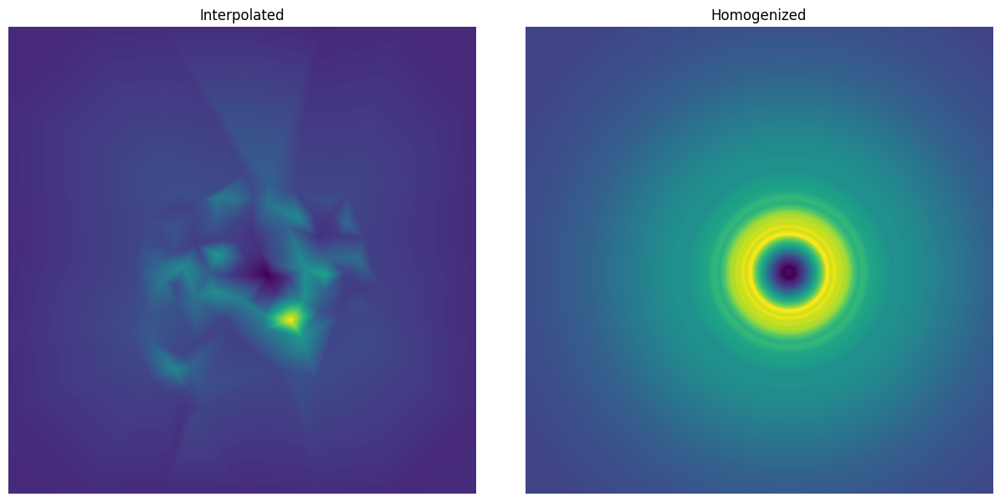

In [27]:
def linear_interpolate(shape, points):
    x = np.array([point[1] for point in points])
    y = np.array([point[0] for point in points])
    values = np.array([point[2] for point in points])

    x_grid, y_grid = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))

    interpolated_values = scipy.interpolate.griddata((x, y), values, (x_grid, y_grid), method='linear')
    return interpolated_values


interp = linear_interpolate(image.shape, selected_segmentation)
hom = homogenize(interp, start_place)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12.5, 6), dpi=100)
ax[0].imshow(interp)
ax[0].set_title('Interpolated')
ax[0].axis('off')

ax[1].imshow(hom)
ax[1].set_title('Homogenized')
ax[1].axis('off')

fig.tight_layout()
plt.show()

##### Cubic

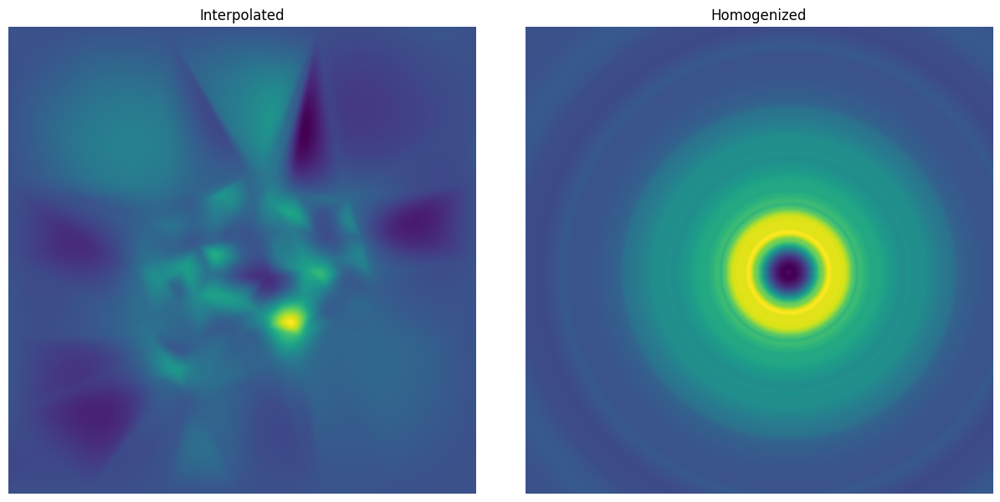

In [28]:
def cubic_interpolate(shape, points):
    x = np.array([point[1] for point in points])
    y = np.array([point[0] for point in points])
    values = np.array([point[2] for point in points])

    x_grid, y_grid = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))

    interpolated_values = scipy.interpolate.griddata((x, y), values, (x_grid, y_grid), method='cubic')
    return interpolated_values


interp = cubic_interpolate(image.shape, selected_segmentation)
hom = homogenize(interp, start_place)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12.5, 6), dpi=100)
ax[0].imshow(interp)
ax[0].set_title('Interpolated')
ax[0].axis('off')

ax[1].imshow(hom)
ax[1].set_title('Homogenized')
ax[1].axis('off')

fig.tight_layout()
plt.show()

##### KNN

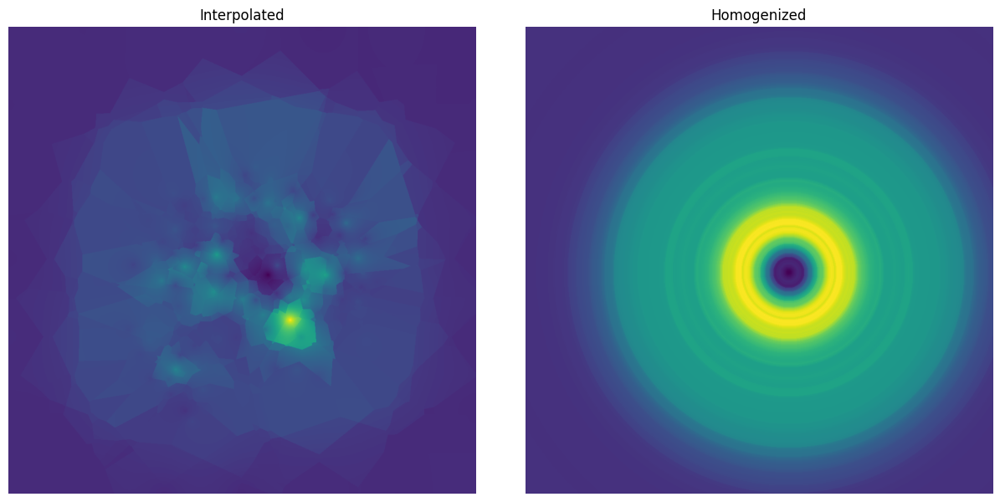

In [29]:
def knn_interpolate(shape, points, num_neighbors):
    x = np.array([point[1] for point in points])
    y = np.array([point[0] for point in points])
    values = np.array([point[2] for point in points])

    x_grid, y_grid = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))

    grid_coordinates = np.column_stack((x_grid.ravel(), y_grid.ravel()))
    distances = scipy.spatial.distance.cdist(grid_coordinates, np.column_stack((x, y)))
    indices = np.argpartition(distances, num_neighbors, axis=1)[:, :num_neighbors]

    d = distances[np.arange(distances.shape[0])[:, None], indices]
    weights = 1 / np.where(d == 0, 1e6, d)
    interpolated_values = np.sum(values[indices] * weights, axis=1) / np.sum(weights, axis=1)

    return interpolated_values.reshape(shape)


interp = knn_interpolate(image.shape, selected_segmentation, 3)
hom = homogenize(interp, start_place)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12.5, 6), dpi=100)
ax[0].imshow(interp)
ax[0].set_title('Interpolated')
ax[0].axis('off')

ax[1].imshow(hom)
ax[1].set_title('Homogenized')
ax[1].axis('off')

fig.tight_layout()
plt.show()

#### Comparisons

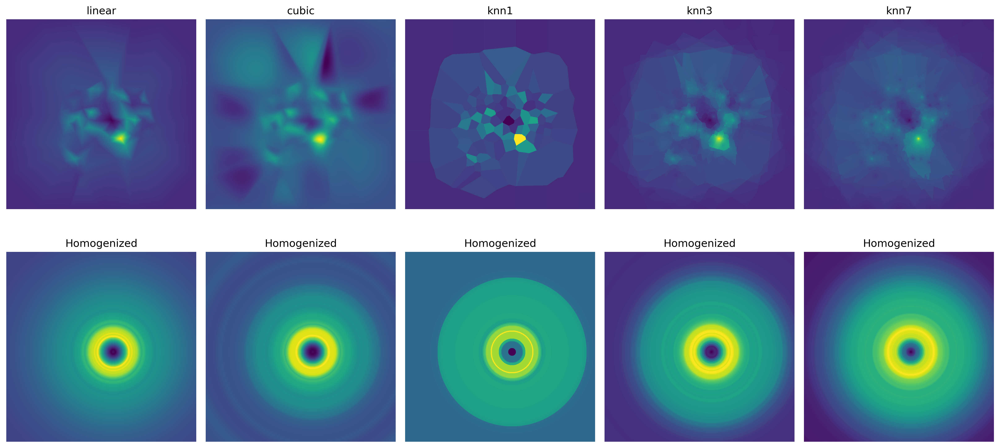

In [30]:
interps = []

interps += [('linear', linear_interpolate(image.shape, selected_segmentation))]
interps += [('cubic', cubic_interpolate(image.shape, selected_segmentation))]
interps += [('knn1', knn_interpolate(image.shape, selected_segmentation, 1))]
interps += [('knn3', knn_interpolate(image.shape, selected_segmentation, 3))]
interps += [('knn7', knn_interpolate(image.shape, selected_segmentation, 7))]

fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(16, 8), dpi=300)

for i, (name, interp) in enumerate(interps):
    ax[0][i].imshow(interp)
    ax[0][i].set_title(name)
    ax[0][i].axis('off')

    ax[1][i].imshow(homogenize(interp, start_place))
    ax[1][i].set_title('Homogenized')
    ax[1][i].axis('off')

fig.tight_layout()
plt.show()